# Preparation before training

In [5]:
##### import everything and set paths to coco weights, log dir ####
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' # Avoid AVX Warning from using CPU
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1" # Apply this line if you want to use CPU only
import sys
import random
import math
import re
import time
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt
import h5py
from imgaug import augmenters as iaa
from imgaug import parameters as iap
from glob import glob

# Root directory of the project
ROOT_DIR = os.path.abspath('/FishSeg/')

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

import tensorflow as tf
config = tf.compat.v1.ConfigProto()
gpus = tf.config.experimental.list_physical_devices('GPU') # If there is any GPU available
for gpu in gpus:
  tf.config.experimental.set_memory_growth(gpu, True) # Allocating GPU memory
config.gpu_options.per_process_gpu_memory_fraction = 0.6 # Set maximum consumption of GPU limit to 0.6  
sess = tf.compat.v1.Session(config=config)

# for visualization
def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax


#### replicate the classes used in TrackUtil annotations and create a config instance used for training ####
classes = {1: 'trout'}

class Config(Config):
    NAME = 'trout'
    
    BACKBONE = 'resnet101'
    
    GPU_COUNT = 1
    IMAGES_PER_GPU = 4
    # BATCH_SIZE = IMAGES_PER_GPU * GPU_COUNT
    
    NUM_CLASSES = len(classes) + 1  # background + number of classes

    IMAGE_MIN_DIM = 1024 # set resolution for training (image downsampling)
    IMAGE_MAX_DIM = 1024
    
    IMAGE_RESIZE_MODE = 'square'

    # Use smaller anchors because our image and objects are small
    RPN_ANCHOR_SCALES = (16, 32, 128, 256, 512)

    # Reduce training ROIs per image because the images are small and have
    # few objects. Aim to allow ROI sampling to pick 33% positive ROIs.
    TRAIN_ROIS_PER_IMAGE = 250

    # Use a small epoch since the data is simple
    STEPS_PER_EPOCH = 200

    # use small validation steps since the epoch is small
    VALIDATION_STEPS = 50
    
    # Reduce the number of objects since there are not many objects in one image
    MAX_GT_INSTANCES = 5 # 100 in the default setting
    
    DETECTION_MIN_CONFIDENCE = 0.8
    
    LOSS_WEIGHTS = {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 0.5, 'mrcnn_mask_loss': 0.3}
    
config = Config()
config.display()

#### define our custom Dataset class that loads the datasets exported with TrackUtil ####
from multiprocessing import Lock, Value, Pool, cpu_count
import tqdm

def init_pool(l, c):
    global lock, count
    lock = l
    count = c

class Dataset(utils.Dataset):
    
    def load_images(self, annotation_file, classes, source, mode='full'):
        self.classes = classes
        self.annotation_file = annotation_file
        self.temp = os.path.join(os.path.join(os.path.dirname(annotation_file), os.path.split(annotation_file)[-1] + 'temp'))
        if not os.path.exists(self.temp):
            os.mkdir(self.temp)
        with h5py.File(self.annotation_file, 'r') as h5_file:
            for c in self.classes:
                self.add_class(source, c, self.classes[c])
            self.images = h5_file['annotations'][:].astype(str)
        np.random.seed(0)
        image_idx = np.arange(self.images.size)
        if mode == 'train':
            val_idx = np.random.choice(image_idx, image_idx.size // 20)
            self.images = self.images[np.invert(np.isin(image_idx, val_idx))]
        elif mode == 'val':
            val_idx = np.random.choice(image_idx, image_idx.size // 20)
            self.images = self.images[np.invert(np.isin(image_idx, val_idx))]
        else:
            print('Warning: set mode to "train" or "val", otherwise using full dataset')
        
        # Read and write image data from .h5 annotation file
        for i in range(len(self.images)):
            path = os.path.join(self.images[i],'image')
            path = path.replace('\\','/') # Essential line to move from Linux/Ubuntun system to Windows
            img_path = os.path.join(self.temp, os.path.split(path)[0].replace('/', '-').replace(':', '') + '.png')
            if os.path.exists(img_path):
                height, width = cv2.imread(img_path).shape[:2]
            else:
                with h5py.File(annotation_file, 'r') as h5_file:
                    height, width = h5_file[path][:].shape[:2]
                    image = h5_file[path][:]
                    cv2.imwrite(img_path, image[:, :, ::-1])
            self.add_image(source,image_id=i,path=path,width=width,height=height)      
    
    def load_image(self, image_id):
        info = self.image_info[image_id]
        path = info['path']
        img_path = os.path.join(self.temp, os.path.split(path)[0].replace('/', '-').replace(':', '') + '.png')
        print(img_path)
        image = cv2.imread(img_path)[:, :, ::-1]
        return image
    
    def load_mask(self, image_id):
        info = self.image_info[image_id]
        img_path = info['path']
        path = os.path.split(img_path)[0]
        with h5py.File(self.annotation_file, 'r') as h5_file:
            mask_path = os.path.join(path, 'mask')
            mask_path = mask_path.replace('\\','/')
            mask = h5_file[mask_path][:]
            class_names_path = os.path.join(path,'class_names')
            class_names_path = class_names_path.replace('\\','/')
            classes = h5_file[class_names_path][:].astype(str)
        use = np.array([idx for idx, name in enumerate(classes) for c in self.classes if name in self.classes[c].split(',')], dtype=np.int32)
        class_ids = np.array([c for name in classes for c in self.classes if name in self.classes[c].split(',')], dtype=np.int32)
        mask = mask[:, :, use]
        non_empty = mask.sum(axis=(0, 1)) > 10
        return mask[:, :, non_empty], class_ids[non_empty]
    
    def prepare(self):
        super().prepare()
        print('{} images, classes: '.format(len(self.image_ids)), *['[{}: {}]'.format(idx, self.classes[idx]) for idx in self.classes])


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     4
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        35
DETECTION_MIN_CONFIDENCE       0.8
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 4
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  1024
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 0.5, 'mrcnn_mask_loss': 0.5}
MASK_POOL_SIZE                 14
MASK_SHAPE          

289 images, classes:  [1: trout]
111 images, classes:  [1: trout]
/Mask_RCNN_FishSeg/trout/Dataset\newvalidation115.h5temp\final_bgs.avi-20876.png


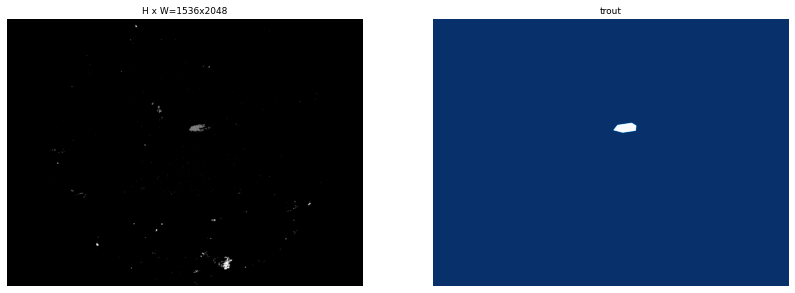

/Mask_RCNN_FishSeg/trout/Dataset\newvalidation115.h5temp\final_bgs.avi-20908.png


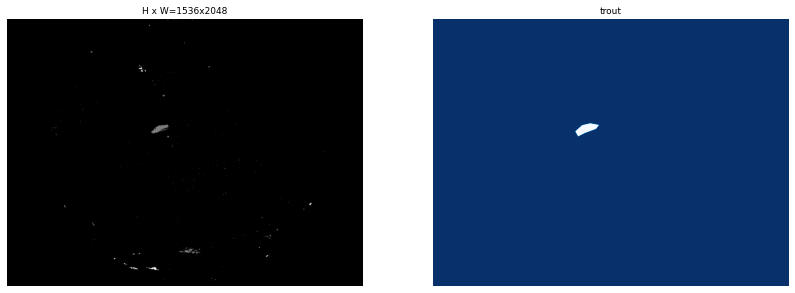

/Mask_RCNN_FishSeg/trout/Dataset\newvalidation115.h5temp\final_bgs.avi-21023.png


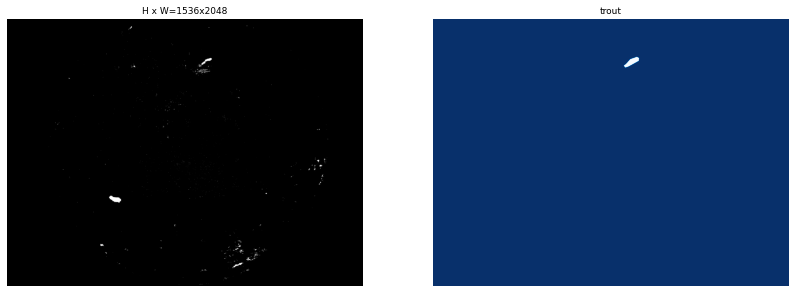

In [6]:
#### use image augmentations via the imgaug package to avoid overfitting ####
augmentation = iaa.Sequential([   
    
    iaa.Fliplr(0.5),
    iaa.Flipud(0.5),
    iaa.Affine(rotate=iap.Choice([0,90,180,270])),
    iaa.Affine(scale={'x': (0.8, 1.2), 'y': (0.8, 1.2)},
                      translate_percent={'x': (-0.2, 0.2), 'y': (-0.2, 0.2)},
                      rotate=(-45, 45))
    ], random_order=True)


#### Prepare training and validation dataset ####
# Training Dataset
dataset_train = Dataset()
dataset_train.load_images(annotation_file='/FishSeg/trout/Dataset/newtraining304.h5',
                         classes=classes,
                         source='trout',
                         mode = 'train')
dataset_train.prepare()

# Validation Dataset
dataset_val = Dataset()
dataset_val.load_images(annotation_file='/FishSeg/trout/Dataset/newvalidation115.h5',
                        classes=classes,
                        source='trout',
                        mode = 'val') 
dataset_val.prepare()


##### Visualize some annotations #####
image_ids = dataset_val.image_ids[:3]
for image_id in image_ids:
    image = dataset_val.load_image(image_id)
    mask, class_ids = dataset_val.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset_val.class_names, limit=1)

# Start training

## Train model

In [10]:
#### create Mask_RCNN model ####
model = modellib.MaskRCNN(mode='training', config=config, model_dir=MODEL_DIR) # Define the model

#### Start training from pretrained weights ####
## Important: 
    # Block 1: if you want to start training from coco weights 
      # you can also use 'last' weights, but the weight files will not be continuously recorded in the same "logs" due to some internal network design
      # so we suggest you to save your model and use block 2 if you want to continue training
    # Block 2: if you want to continue training based on pretrained model
    # If you want you use block 1, you need to comment block 2 to avoid conflict, and vice versa.

## Block 1 ##
# # Which weights to start with?
# init_with = 'coco'  # coco, or last
# ly_names=['mrcnn_class_logits', 'mrcnn_bbox_fc', 
# 'mrcnn_bbox', 'mrcnn_mask']
# # ly_decodes=[unicode(s) for s in ly_names]

# if init_with == 'coco':
#     model.load_weights(COCO_MODEL_PATH, by_name=True,
#                       exclude=ly_names)
# elif init_with == 'last':
#     model.load_weights(model.find_last(), by_name=True) # model.find_last()

## Block 2 ##
MY_MODEL_PATH = '/FishSeg/trout/save_model/Run_1/test0731_epoch60.h5'
ly_names=['mrcnn_class_logits', 'mrcnn_bbox_fc', 
'mrcnn_bbox', 'mrcnn_mask']
model.load_weights(MY_MODEL_PATH,by_name=True,
                   exclude=ly_names)

#### Train the model layers ####
# Train the head layers
model.train(dataset_train, dataset_val,
            learning_rate=config.LEARNING_RATE, 
            epochs=5, 
            layers='heads',
            augmentation=augmentation)

# Fine-tune all layers
model.train(dataset_train, dataset_val, 
            learning_rate=config.LEARNING_RATE / 10,
            epochs=60, 
            layers='all',
            augmentation=augmentation)


Starting at epoch 0. LR=0.001

Checkpoint Path: C:\Mask_RCNN_FishSeg\logs\trout20220718T1558\mask_rcnn_trout_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
rpn_model              (Functional)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_mask_bn4         (TimeDistributed)
mrcnn_bbox_fc          (TimeDistributed)
mrcnn_mask_deconv      (

C:\Apps\Anaconda3\envs\FishSeg\lib\site-packages\keras\optimizer_v2\gradient_descent.py:102: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


KeyboardInterrupt: 

In [ ]:
#### create a config instance used for inference ####
class InferenceConfig(Config):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    
    IMAGE_MAX_DIM = 1024
    IMAGE_MIN_DIM = 1024
    
    IMAGE_RESIZE_MODE = 'square'
    MAX_GT_INSTANCES = 5    
    Train_ROIs_Per_Image = 250
    DETECTION_MIN_CONFIDENCE = 0.8

inference_config = InferenceConfig()
batch_size = inference_config.BATCH_SIZE

model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

## Select Block 1 or 2 depending on your needs
#### Block 1: load the last training weight for inference ####
model.load_weights(model.find_last(), by_name=True) 

#### Block 2: load weights from saved model ####
# test_model = os.path.join(ROOT_DIR, "trout/save_model/Run_1/", "test0731_epoch60.h5") 
# model.load_weights(test_model, by_name=True) # 72


Starting at epoch 0. LR=0.001

Checkpoint Path: C:\Mask_RCNN_FishSeg\logs\trout20220524T1515\mask_rcnn_trout_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
rpn_model              (Functional)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_mask_bn4         (TimeDistributed)
mrcnn_bbox_fc          (TimeDistributed)
mrcnn_mask_deconv      (

C:\Apps\Anaconda3\envs\FishSeg\lib\site-packages\keras\optimizer_v2\gradient_descent.py:102: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


Epoch 1/3
/Mask_RCNN_FishSeg/trout/Dataset\314_0_out.h5temp\314_0_undist_out.avi-369.png


C:\Apps\Anaconda3\envs\FishSeg\lib\site-packages\tensorflow\python\framework\indexed_slices.py:448: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("training/SGD/gradients/gradients/roi_align_classifier/concat_grad/sub:0", shape=(None,), dtype=int32), values=Tensor("training/SGD/gradients/gradients/roi_align_classifier/concat_grad/GatherV2_2:0", shape=(None, 7, 7, 256), dtype=float32), dense_shape=Tensor("training/SGD/gradients/gradients/roi_align_classifier/concat_grad/Shape:0", shape=(4,), dtype=int32))) to a dense Tensor of unknown shape. This may consume a large amount of memory.
  warnings.warn(
C:\Apps\Anaconda3\envs\FishSeg\lib\site-packages\tensorflow\python\framework\indexed_slices.py:448: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("training/SGD/gradients/gradients/roi_align_classifier/concat_grad/sub_1:0", shape=(None,), dtype=int32), values=Tensor("training/SGD/gradients/gradients/roi_align_classifier/concat_grad/Gathe

10/10 [==============================] - ETA: 0s - batch: 4.5000 - size: 1.0000 - loss: 14.7850 - rpn_class_loss: 1.9202 - rpn_bbox_loss: 12.6096 - mrcnn_class_loss: 0.2552 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-200.png


C:\Apps\Anaconda3\envs\FishSeg\lib\site-packages\keras\engine\training_v1.py:2057: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-930.png
/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-200.png
/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-200.png
/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-930.png
10/10 [==============================] - 31s 2s/step - batch: 4.5000 - size: 1.0000 - loss: 14.7850 - rpn_class_loss: 1.9202 - rpn_bbox_loss: 12.6096 - mrcnn_class_loss: 0.2552 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00 - val_loss: 44.5972 - val_rpn_class_loss: 0.5396 - val_rpn_bbox_loss: 44.0576 - val_mrcnn_class_loss: 0.0000e+00 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00
Epoch 2/3
/Mask_RCNN_FishSeg/trout/Dataset\314_0_out.h5temp\314_0_undist_out.avi-2004.png
10/10 [==============================] - ETA: 0s - batch: 4.5000 - size: 1.0000 - loss: 27.8554 - rpn_class_loss: 0.2784 - rpn_bbox_loss: 27.5769 - mrcnn_class_loss: 0.0000e+00 - mrcnn_bbox_loss: 0.0000e+

10/10 [==============================] - 11s 1s/step - batch: 4.5000 - size: 1.0000 - loss: 22.0677 - rpn_class_loss: 0.3705 - rpn_bbox_loss: 21.6972 - mrcnn_class_loss: 0.0000e+00 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00 - val_loss: 23.6183 - val_rpn_class_loss: 0.8470 - val_rpn_bbox_loss: 22.7713 - val_mrcnn_class_loss: 0.0000e+00 - val_mrcnn_bbox_loss: 0.0000e+00 - val_mrcnn_mask_loss: 0.0000e+00

Starting at epoch 3. LR=0.0001

Checkpoint Path: C:\Mask_RCNN_FishSeg\logs\trout20220524T1515\mask_rcnn_trout_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (

C:\Apps\Anaconda3\envs\FishSeg\lib\site-packages\keras\optimizer_v2\gradient_descent.py:102: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


Instructions for updating:
Use fn_output_signature instead
Re-starting from epoch 3
/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-200.png


C:\Apps\Anaconda3\envs\FishSeg\lib\site-packages\keras\engine\training_v1.py:2079: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


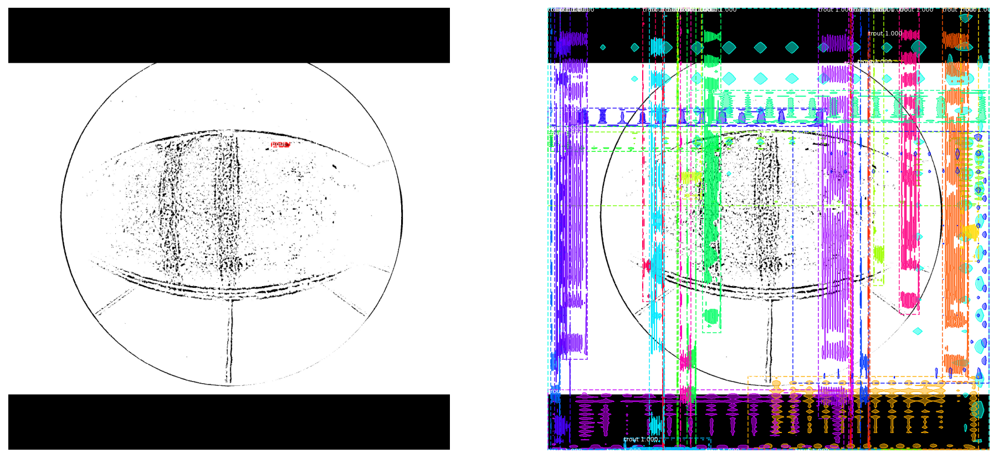

/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-930.png


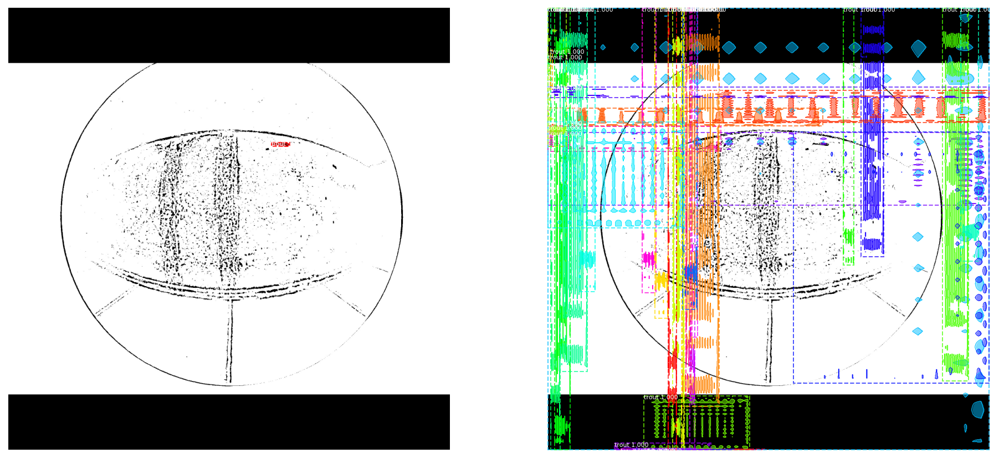

/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-200.png


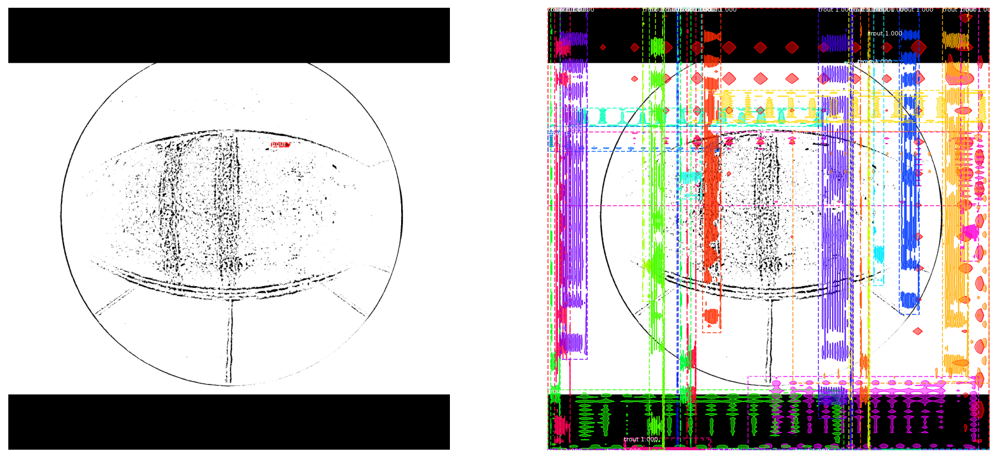

/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-930.png


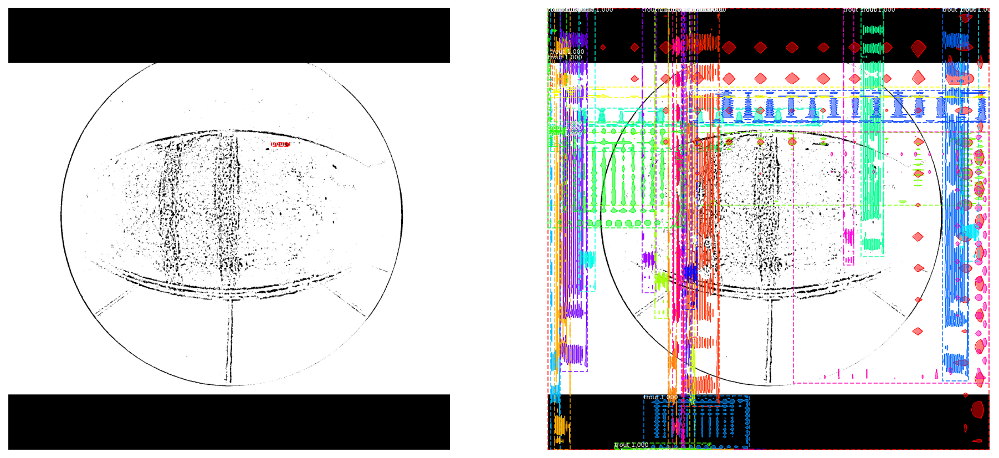

/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-200.png


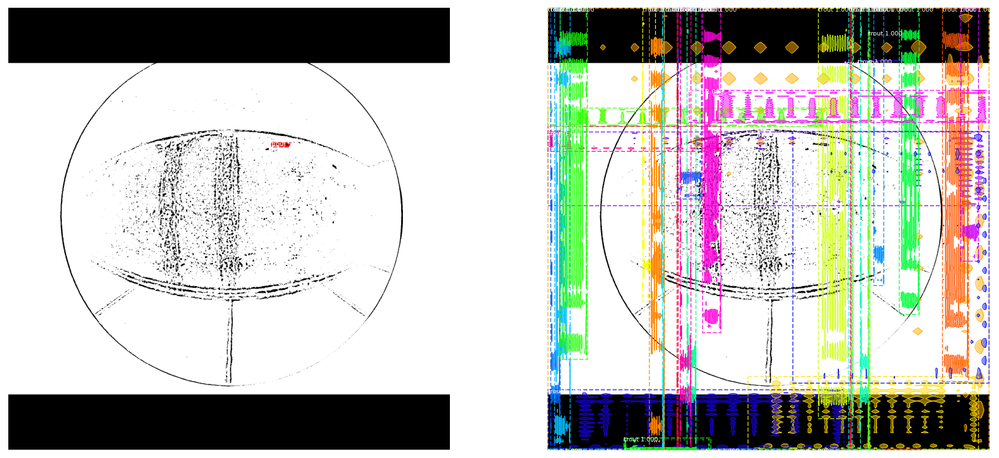

/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-200.png


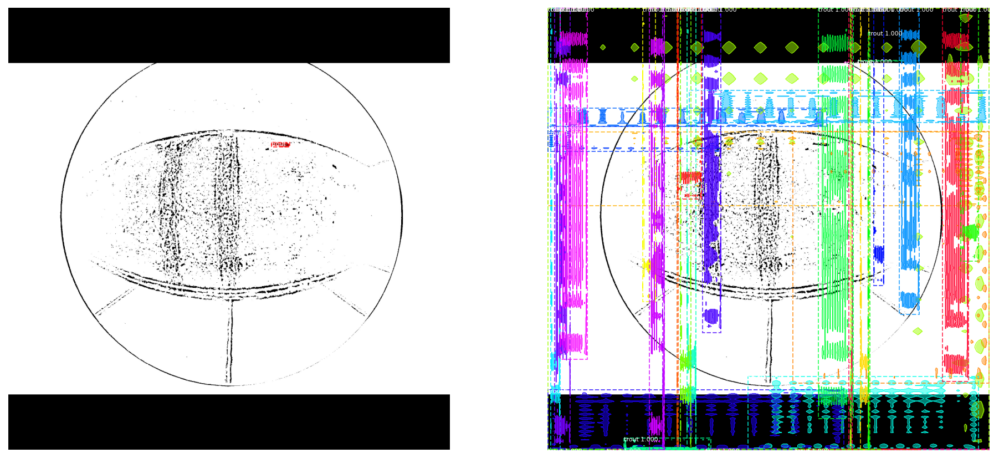

/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-930.png


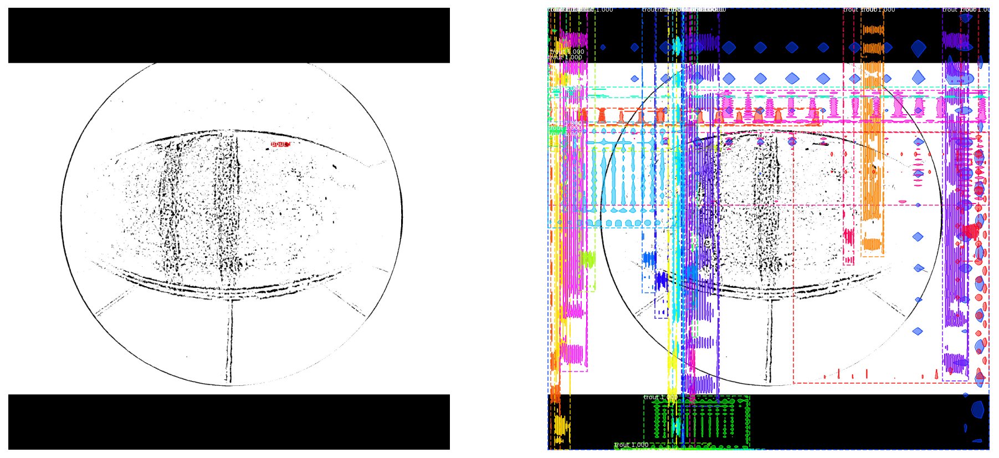

/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-930.png


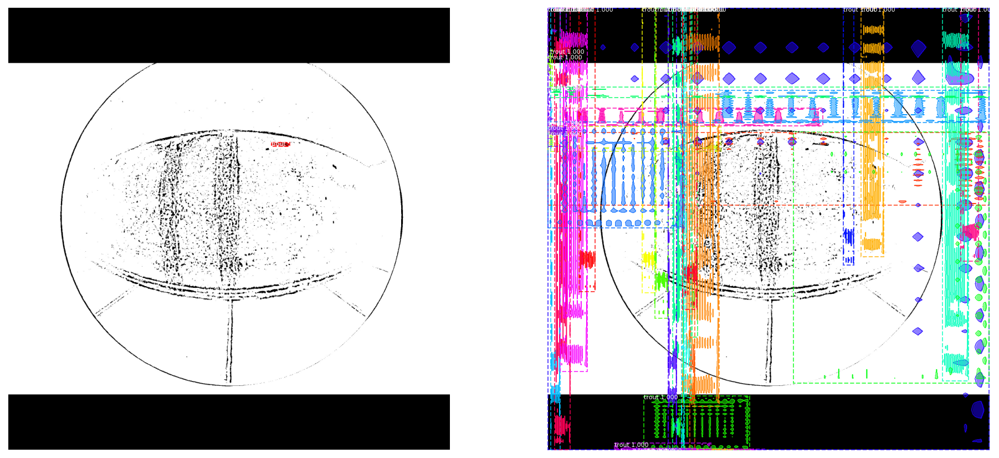

/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-930.png


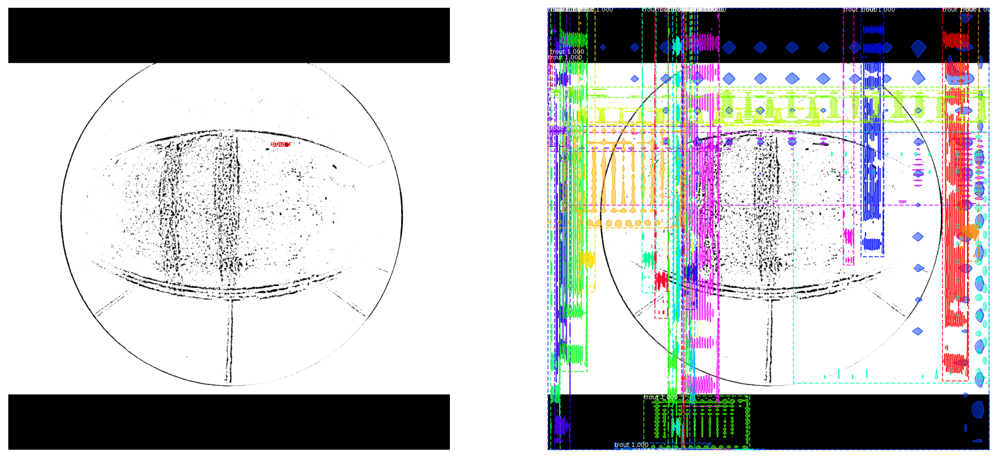

/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-930.png


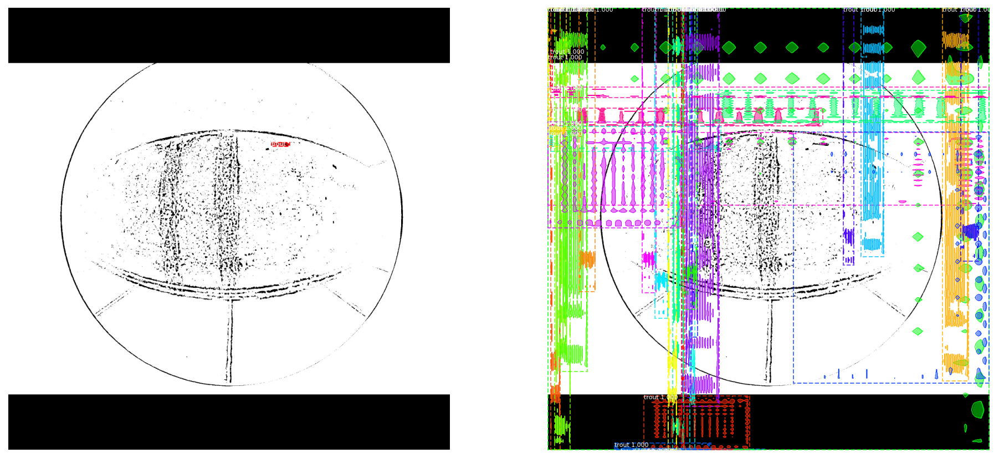

/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-200.png


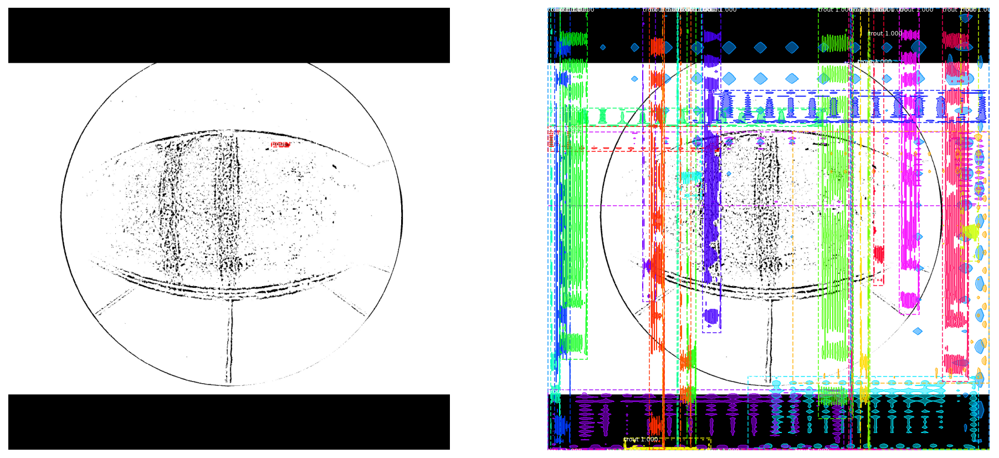

/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-930.png


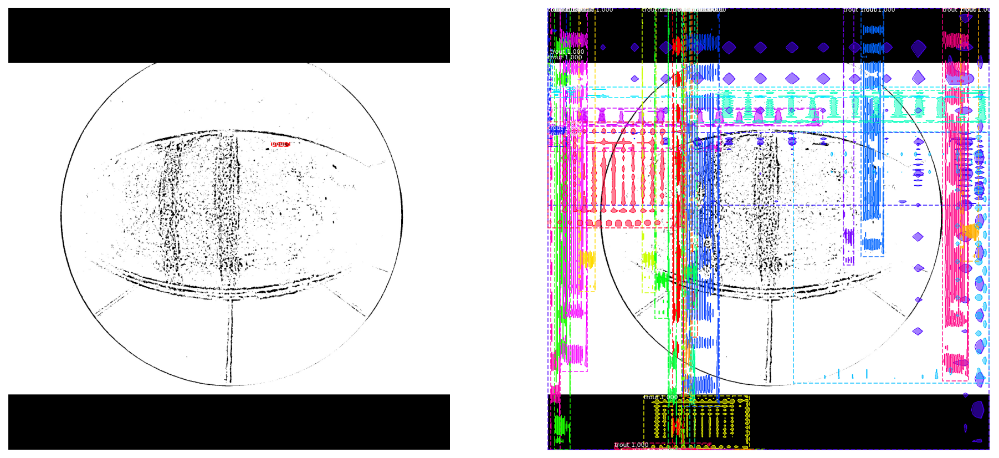

/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-930.png


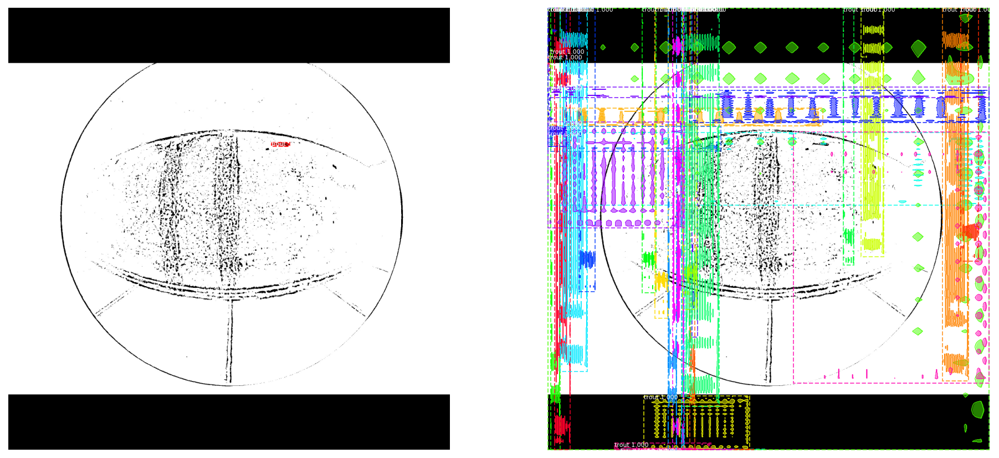

/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-930.png


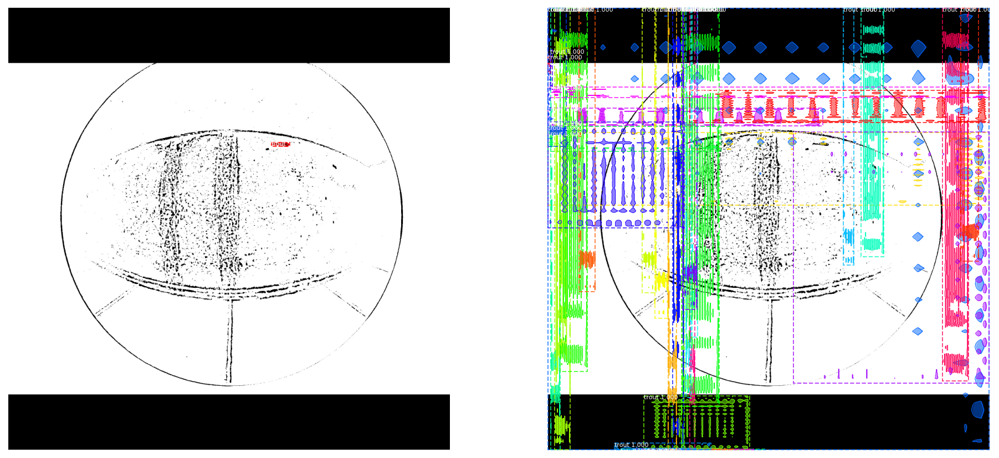

/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-200.png


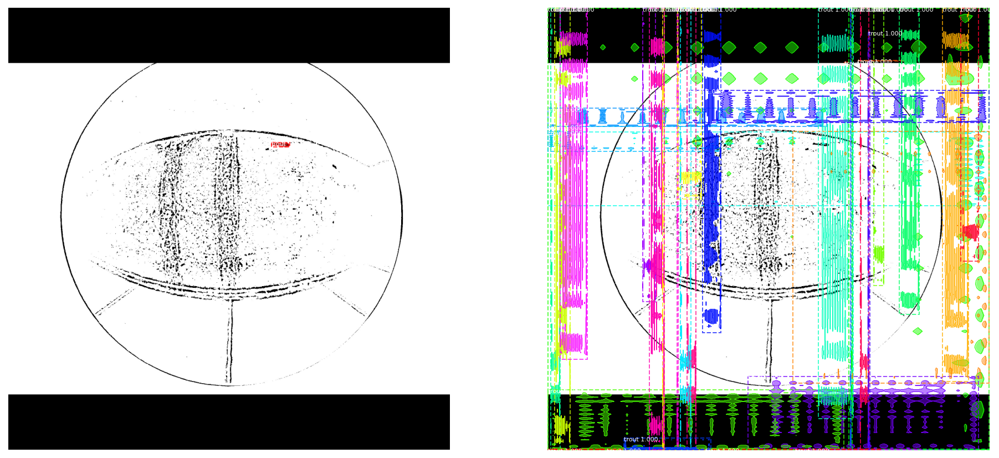

/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-200.png


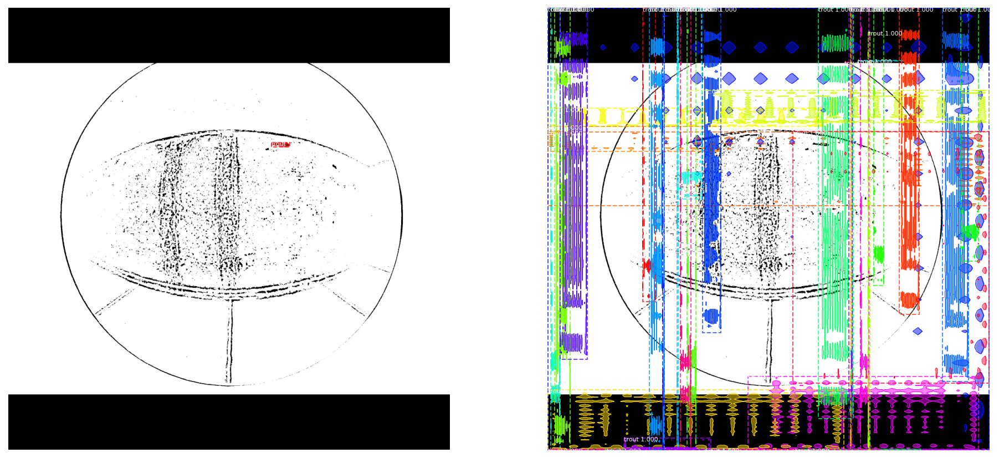

/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-200.png


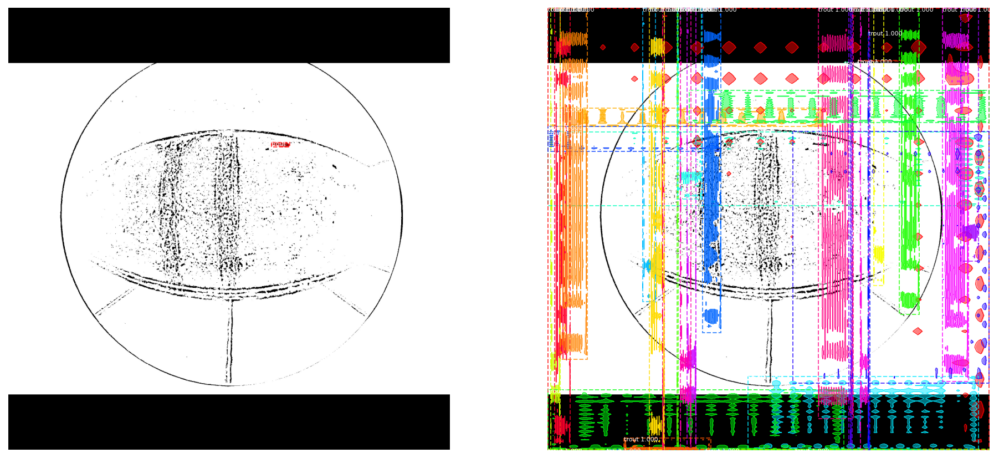

/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-200.png


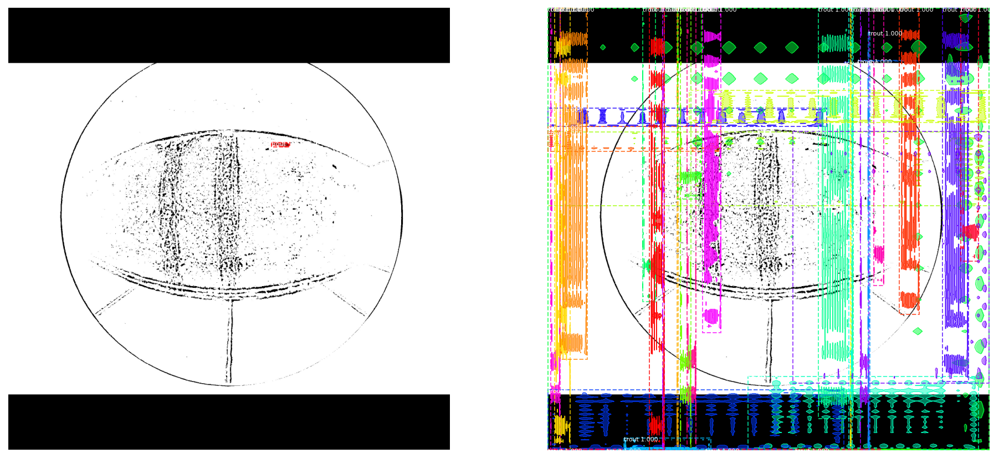

/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-930.png


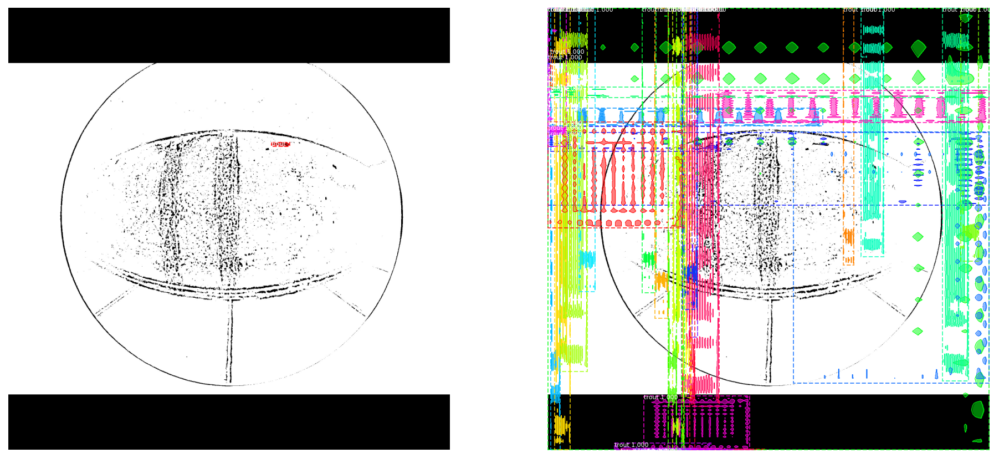

/Mask_RCNN_FishSeg/trout/Dataset\319_0_out.h5temp\319_0_out.avi-930.png


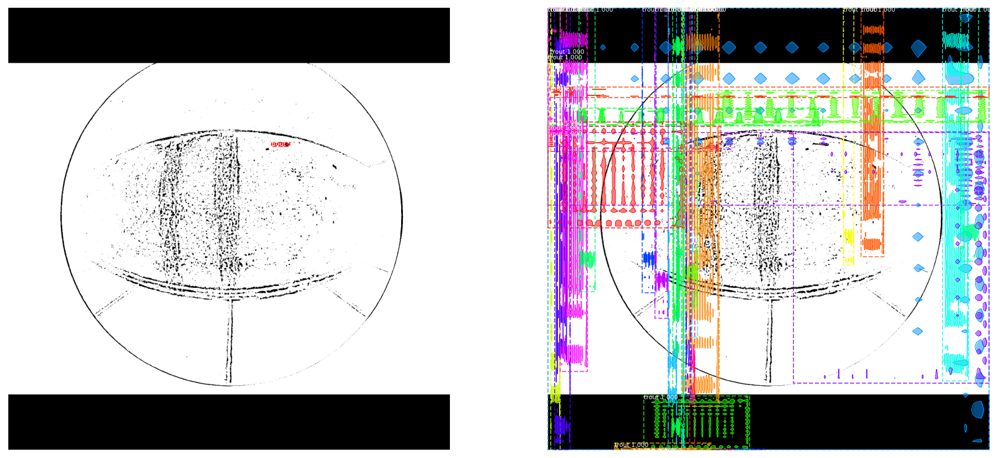

In [4]:
#### visualize inference on some images of the validation set ####
threshold = 0.96

image_ids = np.random.choice(dataset_val.image_ids, 20)
for image_id in image_ids:
    original_image, image_meta, gt_class_id, gt_bbox, gt_mask =        modellib.load_image_gt(dataset_val, inference_config, 
                               image_id, use_mini_mask=False)

    fig, ax = plt.subplots(1, 2, figsize=(32, 32))

    visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                                dataset_train.class_names, figsize=(16, 16), ax=ax[0])

    results = model.detect([original_image], verbose=0)

    r = results[0]
    visualize.display_instances(original_image, r['rois'][r['scores'] > threshold], r['masks'][:, :, r['scores'] > threshold], r['class_ids'][r['scores'] > threshold], 
                                dataset_val.class_names, r['scores'][r['scores'] > threshold], ax=ax[1])

    plt.show()

## Save and check training results

### Check loss functions

In [1]:
#### check loss and val_loss of the model using tensorboard ####
#Use this line if you use tensorboard for the first time
%load_ext tensorboard 
# %reload_ext tensorboard # Use this line if you re-use tensorboard

%tensorboard --logdir="/FishSeg/logs"

### Save current model

In [8]:
#### save the whole model in the HDF5 file ####
  # usually takes several minutes, you can have a coffee
from tensorflow import keras
model.keras_model.save('/FishSeg/trout/save_model/Run_1/test0823_epoch60.h5')

C:\Apps\Anaconda3\envs\FishSeg\lib\site-packages\keras\engine\functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


# Test model with videos

## Define functions before testing

In [3]:
##### define some functions for inference and visualization ####
def generate_tiles(img, size=512, overlap=100, shifts=1, as_list=False):
    height, width = img.shape[:2]
    origins = np.mgrid[0:height:(size // shifts - overlap),0:width:(size // shifts - overlap)].T.reshape(-1,2)
    imgs = []
    for tl in origins:
        tile = img[tl[0]:(tl[0] + size), tl[1]:(tl[1] + size)]
        if tile.shape[0] < size and tile.shape[1] == size:
            tile = img[(height - size):height, tl[1]:(tl[1] + size)]
        elif tile.shape[0] == size and tile.shape[1] < size:
            tile = img[tl[0]:(tl[0] + size), (width - size):width]
        elif tile.shape[0] < size and tile.shape[1] < size:
            tile = img[(height - size):height, (width - size):width]
        imgs.append(tile)
    if as_list:
        return imgs
    return np.stack(imgs, axis=2)

def stitch_tiles(tiles, target_shape, size=512, overlap=100, shifts=1, flatten=False):
    height, width = target_shape[:2]
    origins = np.mgrid[0:height:(size // shifts - overlap),0:width:(size // shifts - overlap)].T.reshape(-1,2)
    img = np.zeros((height, width, np.sum([tile.shape[2] for tile in tiles])), dtype=np.uint8)
    idx = 0
    for tile, tl in zip(tiles, origins):
        if tl[0] + size > height:
            tl[0] = height - size
        if tl[1] + size > width:
            tl[1] = width - size
        img[tl[0]:(tl[0] + size), tl[1]:(tl[1] + size), idx:(idx + tile.shape[2])] = tile
        idx += tile.shape[2]
    if flatten:
        img = img.sum(axis=(2)) > 0
    return img

def stitch_rois(rois, target_shape, size=512, overlap=100, shifts=1):
    height, width = target_shape[:2]
    origins = np.mgrid[0:height:(size // shifts - overlap),0:width:(size // shifts - overlap)].T.reshape(-1,2)
    for idx, (roi, tl) in enumerate(zip(rois, origins)):
        if tl[0] + size > height:
            tl[0] = height - size
        if tl[1] + size > width:
            tl[1] = width - size
        rois[idx][:, ::2] += tl[0]
        rois[idx][:, 1::2] += tl[1]
    rois = np.concatenate(rois)
    return rois

def stitch_predictions(results, target_shape, size=512, overlap=100, shifts=1):
    stitched_result = {}
    stitched_result['masks'] = stitch_tiles([result['masks'] for result in results], target_shape, size, overlap, shifts)
    stitched_result['rois'] = stitch_rois([result['rois'] for result in results], target_shape, size, overlap, shifts)
    stitched_result['scores'] = np.concatenate([result['scores'] for result in results])
    stitched_result['class_ids'] = np.concatenate([result['class_ids'] for result in results])
    return stitched_result

import colorsys
from glob import glob
import h5py
import skvideo.io

def split_image(image, overlap=1/6):
    shape = image.shape[:2]
    overlap = round(min(shape) * overlap / 2)
    ul = np.concatenate([np.array([0, 0]), np.array(shape) / 2 + overlap]).astype(np.int)
    ur = np.array([0, shape[1] / 2 - overlap, shape[0] / 2 + overlap, shape[1]]).astype(np.int)
    bl = np.array([shape[0] / 2 - overlap, 0, shape[0], shape[1] / 2 + overlap]).astype(np.int)
    br = np.concatenate([np.array(shape) / 2 - overlap, shape]).astype(np.int)
    ul = image[ul[0]:ul[2], ul[1]:ul[3]]
    ur = image[ur[0]:ur[2], ur[1]:ur[3]]
    bl = image[bl[0]:bl[2], bl[1]:bl[3]]
    br = image[br[0]:br[2], br[1]:br[3]]
    return [ul, ur, bl, br]

def random_colors(N, bright=True):
    """
    Generate random colors.
    To get visually distinct colors, generate them in HSV space then
    convert to RGB.
    """
    brightness = 1.0 if bright else 0.7
    hsv = [(i / N, 1, brightness) for i in range(N)]
    colors = list(map(lambda c: colorsys.hsv_to_rgb(*c), hsv))
    random.shuffle(colors)
    return colors

def apply_mask(image, mask, color, alpha=0.25):
    """Apply the given mask to the image.
    """
    for c in range(3):
        image[:, :, c] = np.where(mask == 1,
                                  image[:, :, c] *
                                  (1 - alpha) + alpha * color[c] * 255,
                                  image[:, :, c])
        image = image.astype(np.uint8)
    return image

def draw_instances(image, boxes, masks, class_ids, class_names, scores=None):
    if len(image.shape) > 2 and image.shape[2] == 1:
        image = np.stack([image.reshape(*image.shape[:2])] * 3, axis=2)
    N = boxes.shape[0]
    if not N:
        return image
    else:
        colors = random_colors(N)
        height, width = image.shape[:2]
        masked_image = image.astype(np.uint32).copy()
        for i in range(N):
            color = colors[i]
            if not np.any(boxes[i]):
                continue
            y1, x1, y2, x2 = boxes[i]
            class_id = class_ids[i]
            score = scores[i] if scores is not None else None
            label = class_names[class_id]
            caption = "{} {:.3f}".format(label, score) if score else label
            mask = masks[:, :, i]
            masked_image = apply_mask(masked_image, mask, color)
            color = [int(c) * 255 for c in color]
#             cv2.rectangle(masked_image, (x1, y1), (x2, y2), color, 1, cv2.LINE_AA)
            cv2.putText(masked_image, caption, (x1, y1 - 8), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1, cv2.LINE_AA)
    return masked_image

## For batch process of video testing

In [ ]:
import skvideo
import skvideo.io
import os

threshold = 0.96

video_path = 'S:\\vaw_public\\yanfan\\FishTracking\\BGS Videos'
output_path = 'S:\\vaw_public\\yanfan\\FishTracking\\Outputs'

class TempStore:
    pass

def LoadVideofiles(video_path,output_path):
    folders = os.listdir(video_path)   
    folder_name = []
    for i in range(len(folders)-6):
        if int(folders[i][0:3])>=320 and int(folders[i][0:3])<=330: # Set the number range for cases that you want to track
            folder_name.append(folders[i])
            
    inpath = [TempStore()]*len(folder_name)
    outpath = [TempStore()]*len(folder_name)
    video_files = [TempStore()]*len(folder_name)    
    
    for i in range(len(folder_name)):
        video_dirs = []
        inpath[i] = os.path.join(video_path,folder_name[i]) 
        outpath[i] = os.path.join(output_path,folder_name[i]+'_results')
        if not os.path.exists(outpath[i]):
            os.mkdir(outpath[i])
        for root, dirs, names in os.walk(inpath[i]):           
            for name in names:
                ext = os.path.splitext(name)[1].replace('\\','/')
                if ext == '.avi':
                    video_dir = os.path.join(root,name)
                    video_dirs.append(video_dir)
        video_files[i] = video_dirs
    return video_files,outpath,inpath

video_files,outpaths,inpaths = LoadVideofiles(video_path,output_path)

for i in range(len(video_files)):
    for j in range(len(video_files[i])):
        queue = []
        images = []
        results = []
        frame_idx = 0
        
        video_name = os.path.splitext(os.path.basename(video_files[i][j]))[0]
        with h5py.File(os.path.join(outpaths[i], 'predictions_' + video_name + '.h5'), 'w') as h5_file:
    
            predictions = h5_file.create_dataset('predictions', shape=(0, ), maxshape=(None, ), dtype='|S200')    
            cap = skvideo.io.vreader(video_files[i][j])

            for idx, frame in enumerate(cap):
                
                images.append(frame)
                tiles = [frame] 
                queue.extend(tiles)
                
                while len(queue) >= batch_size:
                    results.extend(model.detect(queue[:batch_size]))
                    queue = queue[batch_size:]
    
                while len(results) >= len(tiles):
                        
                    r = results[0] 
                    
                    group = h5_file.create_group(str(frame_idx))
                    group.create_dataset('masks', data=r['masks'], compression="gzip", compression_opts=9)
                    group.create_dataset('scores', data=r['scores'])
                    group.create_dataset('classes', data=np.array([classes[c] for c in r['class_ids']], dtype=np.bytes_))
                    
                    predictions.resize((predictions.shape[0] + 1, ))
                    predictions[-1] = np.bytes_(str(frame_idx))
                    
                    frame_idx += 1
                    images = images[1:]
                    results = results[len(tiles):]
                    
                    print('{}'.format(frame_idx), sep=' ', end='\r', flush=True)
            print('Finished tracking: '+video_files[i][j])

## For single video testing

In [6]:
##### run inference on videos after setting paths accordingly ####
import skvideo
import skvideo.io

threshold = 0.96
video_file = 'S:\\vaw_public\\yanfan\\FishTracking\\BGS Videos\\342_2020_27_10_16_26_mog2\\Cam_0_mog2.avi'
outpath = 'S:\\vaw_public\\yanfan\\FishTracking\\Outputs'

queue = []
images = []
results = []
frame_idx = 0

video_name = os.path.splitext(os.path.basename(video_file))[0]
with h5py.File(os.path.join(outpath, 'predictions_' + video_name + '.h5'), 'w') as h5_file:

    predictions = h5_file.create_dataset('predictions', shape=(0, ), maxshape=(None, ), dtype='|S200')

    cap = skvideo.io.vreader(video_file) 
    
    # Comment following line if no image outputs are needed
    # os.makedirs(os.path.join(outpath, 'predictions_' + video_name), exist_ok=True)

    for idx, frame in enumerate(cap):
        
        images.append(frame)
        tiles = [frame] # use this line for faster and smaller outputs
        # tiles = generate_tiles(frame, size=1024, as_list=True) # use this line if images are too big to load for inference
        queue.extend(tiles)
        
        while len(queue) >= batch_size:
            results.extend(model.detect(queue[:batch_size]))
            queue = queue[batch_size:]

        while len(results) >= len(tiles):
                
            r = results[0] # use this line for faster and smaller outputs
            # r = stitch_predictions(results[:len(tiles)], images[0].shape, size=1024) # use this line if images are too big to load for inference
            
            # comment following block to prevent image output
            # masked_img = draw_instances(images[0], r['rois'][r['scores'] > threshold], r['masks'][:, :, r['scores'] > threshold], r['class_ids'][r['scores'] > threshold], 
            #             dataset_val.class_names, r['scores'][r['scores'] > threshold])
            # cv2.imwrite(os.path.join(outpath, 'predictions_' + video_name, 'pred_{:>05}.jpg').format(frame_idx), cv2.cvtColor(masked_img, cv2.COLOR_RGB2BGR))
            
            group = h5_file.create_group(str(frame_idx))
            group.create_dataset('masks', data=r['masks'], compression="gzip", compression_opts=9)
            group.create_dataset('scores', data=r['scores'])
            group.create_dataset('classes', data=np.array([classes[c] for c in r['class_ids']], dtype=np.bytes_))
            
            predictions.resize((predictions.shape[0] + 1, ))
            predictions[-1] = np.bytes_(str(frame_idx))
            
            frame_idx += 1
            images = images[1:]
            results = results[len(tiles):]
            
            print('{}'.format(frame_idx), sep=' ', end='\r', flush=True)
    print('Finished tracking: '+video_file)


UnboundLocalError: local variable 'r' referenced before assignment

# Transvert masks to tracks

## Define functions before transverting

In [ ]:
from scipy.interpolate import splprep, splev
from skimage.morphology import skeletonize
from scipy.optimize import linear_sum_assignment
from sklearn.metrics.pairwise import euclidean_distances
import numpy as np
import cv2
from sklearn.decomposition import PCA
from scipy.interpolate import interp1d
from scipy.signal import savgol_filter
from scipy.signal import find_peaks_cwt
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.cluster import KMeans
from copy import deepcopy
import matplotlib.pyplot as plt
from scipy import interpolate
from sklearn.neighbors import KDTree
import networkx as nx
from sklearn.neighbors import NearestNeighbors
import os
import h5py
from multiprocessing import Pool, cpu_count, Lock, Value
import pandas as pd
import _pickle

# functions definition
def merge_tiles(tiles, classes, width=2704, height=2028):
    layers = np.sum([tile.shape[2] for tile in tiles])
    classes = np.concatenate(classes)
    shape = tiles[0].shape[:2]
    mask = np.zeros((height, width, layers), dtype=np.bool)
    l = 0
    mask[0:shape[0], 0:shape[1], l:(l + tiles[0].shape[2])] = tiles[0]
    l += tiles[0].shape[2]
    mask[0:shape[0], (width - shape[1]):width, l:(l + tiles[1].shape[2])] = tiles[1]
    l += tiles[1].shape[2]
    mask[(height - shape[0]):height, 0:shape[1], l:(l + tiles[2].shape[2])] = tiles[2]
    l += tiles[2].shape[2]
    mask[(height - shape[0]):height, (width - shape[1]):width, l:(l + tiles[3].shape[2])] = tiles[3]
    return mask, classes

def merge_masks(mask, classes, min_overlap=0.75): # check this out
    for l1, c1 in zip(range(mask.shape[2]), classes):
        for l2, c2 in zip(range(mask.shape[2]), classes):
            if l1 == l2 or c1 != c2:
                continue
            overlap = (mask[:, :, l1] & mask[:, :, l2]).sum()
            if overlap == 0:
                continue
            smaller = np.min([mask[:, :, l1].sum(), mask[:, :, l2].sum()])
            if overlap / smaller > min_overlap:
                merged = mask[:, :, l1] | mask[:, :, l2]
                mask[:, :, l1] = merged
                mask[:, :, l2] = 0
    layers = mask.sum(axis=(0, 1)) > 0
    mask = mask[:, :, layers]
    classes = classes[layers]
    return mask, classes

def process_prediction(prediction, file_name, pose=False, flatten=False):
    with h5py.File(file_name, 'r') as h5_file:
        classes = h5_file[prediction]['classes'][:].astype(str)
        masks = h5_file[prediction]['masks'][:]
        scores = h5_file[prediction]['scores'][:]
        count_total = h5_file['predictions'][:].size
    if flatten:
        masks, classes = merge_masks(masks, classes, min_overlap=0.75)
    result = []
    if masks.shape[2] > 0:
        if pose:
            result = generate_poses(masks, n_pts=15)
        else:
            result = generate_positions(masks)
    return result

def approve_assignment(cost_matrix, assignment, max_cost):
    if np.any(cost_matrix[assignment[0], assignment[1]] >= max_cost):
        return False
    return True

def draw_contour(contour, width, height):
    contour = cv2.drawContours(np.zeros((height.astype(np.int) + 1, width.astype(np.int) + 1, 3), dtype=np.uint8), [contour.astype(np.int)], 0, (255, 255, 255), -1, cv2.LINE_AA)
    contour = contour.sum(axis=2) > 0
    return contour

def contour_overlap(contours_current, contours_previous):
    max_cost = np.inf
    cost_matrix = np.zeros((len(contours_current), len(contours_previous))) + max_cost
    for i, current in enumerate(contours_current):
        for j, previous in enumerate(contours_previous):
            intersection = np.sum(current & previous)
            union = np.sum(current | previous)
            cost_matrix[i, j] = union / intersection if intersection > 0 else max_cost
    if np.isfinite(cost_matrix).sum() > 0:
        max_cost = cost_matrix[np.isfinite(cost_matrix)].max() * 10
        cost_matrix[np.isinf(cost_matrix)] = max_cost
    else:
        max_cost = 0
        cost_matrix[:, :] = max_cost
    return cost_matrix, max_cost

def centroid_distance(contours_current, contours_previous):
    max_cost = np.inf
    cost_matrix = np.zeros((len(contours_current), len(contours_previous))) + max_cost
    for i, current in enumerate(contours_current):
        for j, previous in enumerate(contours_previous):
            cost_matrix[i, j] = np.sqrt(np.square(np.argwhere(current).mean(axis=0) - np.argwhere(previous).mean(axis=0)).sum())
    if np.isfinite(cost_matrix).sum() > 0:
        max_cost = cost_matrix[np.isfinite(cost_matrix)].max() * 10
        cost_matrix[np.isinf(cost_matrix)] = max_cost
    else:
        max_cost = 0
        cost_matrix[:, :] = max_cost
    return cost_matrix, max_cost

def assign_identities(positions, frame_idx, contours=None, max_merge_dist=30):
    identities = np.arange(positions.shape[0])
    unique_frame_idx = np.arange(frame_idx.min(), frame_idx.max() + 1)
    detection_count = np.bincount(frame_idx)[frame_idx.min():]
    if contours is None:
        max_cost = max_merge_dist
    for idx, (frame, count) in enumerate(zip(unique_frame_idx, detection_count)):
        print('{:.2f} %'.format(100 * idx / unique_frame_idx.size), sep=' ', end='\r', flush=True)
        if frame == frame_idx.min():
            continue
        else:
            if contours is None:
                positions_current = positions[frame_idx == frame]
                positions_previous = positions[frame_idx == frame - 1]
                if len(positions_current) == 0 or len(positions_previous) == 0:
                    continue
                cost_matrix = euclidean_distances(positions_current, positions_previous)
            else:
                contours_current = contours[frame_idx == frame]
                contours_previous = contours[frame_idx == frame - 1]
                if len(contours_current) == 0 or len(contours_previous) == 0:
                    continue
                contours_concatenated = np.concatenate([np.concatenate([c for c in contours_current], axis=0),
                                                        np.concatenate([c for c in contours_previous], axis=0)])
                xmin, ymin = contours_concatenated.min(axis=0)
                xmax, ymax = contours_concatenated.max(axis=0)
                contours_current = [draw_contour(c - np.array([xmin, ymin]), width=xmax - xmin, height=ymax - ymin)                                     for c in contours_current]
                contours_previous = [draw_contour(c - np.array([xmin, ymin]), width=xmax - xmin, height=ymax - ymin)                                     for c in contours_previous]
                cost_matrix, max_cost = contour_overlap(contours_current, contours_previous)
            assignment = linear_sum_assignment(cost_matrix)
            if not approve_assignment(cost_matrix, assignment, max_cost=max_cost):
                continue
            if count == 1 and detection_count[idx - 1] == 1:
                identities[frame_idx == frame] = int(identities[frame_idx == frame - 1])
            elif count <= detection_count[idx - 1]: # and count > 0
                identities[frame_idx == frame] = identities[frame_idx == frame - 1][assignment[1]]
            elif count > detection_count[idx - 1] and count > 1: # and detection_count[idx - 1] > 0
                current_identities = identities[frame_idx == frame]
                current_identities[assignment[0]] = identities[frame_idx == frame - 1][assignment[1]]
                identities[frame_idx == frame] = current_identities
    for idx, identity in enumerate(np.unique(identities)):
        identities[identities == identity] = idx
    print('{:.2f} %'.format(100))
    return identities

def generate_poses(mask, n_pts):    
    mask = mask.reshape(mask.shape[0], mask.shape[1], -1).astype(np.uint8) * 255
    poses = []
    for layer in range(mask.shape[2]): # mask_copy.shape[2]):
        img = mask[:, :, layer].reshape(mask.shape[0], mask.shape[1])
        poses.append(get_pose(img, n_pts))
    return poses

def generate_positions(mask):
    mask = mask.reshape(mask.shape[0], mask.shape[1], -1).astype(np.uint8) * 255
    positions = []
    for layer in range(mask.shape[2]): # mask_copy.shape[2]):
        img = mask[:, :, layer].reshape(mask.shape[0], mask.shape[1])
        if img.sum() > 0:
            positions.append(get_position(img))
    return positions

def get_position(img):
    return np.mean(np.argwhere(img), axis=0)[::-1]

def get_pose(img, n_pts):
    contours = cv2.findContours(img.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)[-2] # img?
    contours = [cnt.reshape(-1, 2) for cnt in contours if cnt.size > 10]
    contours = [np.append(cnt, cnt[0].reshape(1, 2), axis=0) for cnt in contours]
    if len(contours) == 0:
        return [[]] * 3
    contours = interpol_objects(contours)
    contour = np.concatenate(contours)
    if contour.shape[0] < 5: # and maybe ratio
        return [[]] * 3
    img_copy = img.copy()
    img, xmin, ymin, scale = crop_scale_mask(img, max_len=100)
    skeleton = skeletonize(img > 0)
    pts = np.argwhere(skeleton).reshape(-1, 2)
    mean_distances = euclidean_distances(pts, pts).mean(axis=1)
    end_idx = np.argsort(mean_distances)[-(pts.shape[0] // 4):].reshape(-1)
    end_pts = pts[end_idx]
    if end_pts.shape[0] < 2:
        return [[]] * 3
    kmeans = KMeans(n_clusters=2)
    kmeans.fit(end_pts)
    end_pts = np.round(kmeans.cluster_centers_).astype(np.int)
    if False in [(pt == pts).all(axis=1).any() for pt in end_pts]:
        pts = np.unique(np.concatenate([pts, end_pts]), axis=0)
    end_idx = [np.argwhere((pts == pt).all(axis=1))[0][0] for pt in end_pts]
    nn = 2
    path = []
    while True and nn < pts.shape[0]:
        try:
            clf = NearestNeighbors(nn).fit(pts)
            G = clf.kneighbors_graph()
            T = nx.from_scipy_sparse_matrix(G)

            path = nx.algorithms.shortest_path(T, source=end_idx[0], target=end_idx[1])
            break
        except:
            nn = nn * 2
    if len(path) == 0:
        return [[]] * 3
    spine = pts[path]
    spine = (spine / scale) + np.array([ymin, xmin])
    window_length = spine.shape[0] // 16
    if window_length < 3:
        window_length = 3
    elif window_length % 2 == 0:
        window_length += 1
    if window_length <= spine.shape[0]:
        spine[:, 0] = savgol_filter(spine[:, 0], window_length=window_length, polyorder=1)
        spine[:, 1] = savgol_filter(spine[:, 1], window_length=window_length, polyorder=1)
    dists = np.cumsum(np.sqrt(np.square(np.diff(spine, axis=0)).sum(axis=1)))
    dists = np.concatenate([[0], dists / dists[-1]])
    fx, fy = interp1d(dists, spine[:, 1]), interp1d(dists, spine[:, 0])
    regular = np.linspace(0, 1, n_pts)
    x_regular, y_regular = fx(regular), fy(regular)
    spine = np.transpose([y_regular, x_regular])
    rad = []
    for pt in spine:
        rad.append(np.sort(np.sqrt(np.square(contour - pt[::-1]).sum(axis=1)))[0])
    rad = np.array(rad)
    head_radii = rad[2]
    tail_radii = rad[-2]
    if head_radii < tail_radii:
        spine = spine[::-1]
        rad = rad[::-1]
    return [spine, rad, contour]

def edge_length(edge):
    return np.sum(np.sqrt(np.square(np.diff(edge[:, 0])) + np.square(np.diff(edge[:, 1]))))

def interpol_objects(objects, precision = 5):
    interpolated = []
    for obj in objects:
        length = edge_length(obj)
        tckp, u = splprep([obj[:, 0], obj[:, 1]], s = 0, k = 1)
        obj_x, obj_y = splev(np.linspace(0, 1, 100), tckp)
        obj = np.transpose((obj_x, obj_y))
        interpolated.append(obj)
    return interpolated

def wrap(angles):
    angles = (angles + np.pi) % (2 * np.pi) - np.pi
    return angles

def crop_scale_mask(mask, max_len=100):
    ymin, xmin = np.min(np.argwhere(mask), axis=0)
    ymax, xmax = np.max(np.argwhere(mask), axis=0)
    cropped = mask[ymin:(ymax + 1), xmin:(xmax + 1)]
    scale = max_len / np.max(cropped.shape)
    scaled = cv2.resize(cropped, (0, 0), fx=scale, fy=scale, interpolation=cv2.INTER_AREA)
    return scaled, xmin, ymin, scale

def init_lookup(f, t):
    global frames, tracks
    frames = f
    tracks = t

def identity_lookup(tracks):
    frames = np.array([])
    if tracks['FRAME_IDX'].size > 0:
        frames = np.arange(tracks['FRAME_IDX'].min(), tracks['FRAME_IDX'].max() + 1)
        
    lookup = np.isin(frames, tracks[str(tracks['IDENTITIES'][1])]['FRAME_IDX'])
    for i in tracks['IDENTITIES'][1:]: # Start from second one
        lookup = np.vstack((lookup,np.isin(frames, tracks[str(i)]['FRAME_IDX'])))
    lookup = np.transpose(lookup)
    return lookup

def append_trajectory(trajectory_pre, trajectory_post):
    if np.isin(trajectory_pre['FRAME_IDX'], trajectory_post['FRAME_IDX']).any():
        return trajectory_pre
    appended = {}
    sorted_idx = np.argsort(np.append(trajectory_pre['FRAME_IDX'], trajectory_post['FRAME_IDX']))
    for key in trajectory_pre:
        appended[key] = np.append(trajectory_pre[key], trajectory_post[key], axis=0)[sorted_idx]
    return appended

def get_positions(identities, tracks, idx):
    positions = []
    for i in identities:
        positions.append([tracks[str(i)]['X'][idx], tracks[str(i)]['Y'][idx]])
    return np.array(positions)

def merge_identities(tracks, lookup, max_gap=10, max_distance=20, validate=False, min_size=2):
    frame_idx = np.arange(lookup.shape[0])
    for idx, i in enumerate(range(lookup.shape[1])):
        while True:
            i_lu = np.argwhere(lookup[:, i])
            if i_lu.size == 0:
                break
            i_end = i_lu.max()
            i_position = get_positions([tracks['IDENTITIES'][i]], tracks, -1)
            next_filter = (frame_idx > i_end) & (frame_idx <= i_end + max_gap)
            next_identities = np.argwhere(lookup[next_filter, :].sum(axis=0) > 0).ravel()
            next_start = np.argmax(lookup[:, next_identities], axis=0)
            next_identities = next_identities[next_start > i_end]
            next_start = next_start[next_start > i_end]
            if next_identities.size == 0:
                break
            if validate:
                previous_filter = (frame_idx < np.min(next_start)) & (frame_idx >= i_end - max_gap)
                previous_identities = np.argwhere(lookup[previous_filter, :].sum(axis=0) > 0).ravel()
                previous_identities = previous_identities[previous_identities != i]
                previous_end = lookup.shape[0] - np.argmax(np.flip(lookup[:, previous_identities], axis=0), axis=0) - 1
                previous_identities = previous_identities[previous_end < np.min(next_start)]
                previous_end = previous_end[previous_end < np.min(next_start)]
                if previous_identities.size == 0:
                    break
                previous_positions = get_positions(tracks['IDENTITIES'][previous_identities], tracks, -1)
                validation_cost = euclidean_distances(i_position, previous_positions).ravel()
                if np.any(validation_cost < max_distance):
                    break
            next_positions = get_positions(tracks['IDENTITIES'][next_identities], tracks, 0)
            cost = euclidean_distances(i_position, next_positions).ravel()
            next_identities = next_identities[cost < max_distance]
            next_start = next_start[cost < max_distance]
            if next_identities.size == 0:
                break
            next_identity = next_identities[np.argmin(next_start)]
            if np.isin(tracks[str(tracks['IDENTITIES'][i])]['FRAME_IDX'],
                          tracks[str(tracks['IDENTITIES'][next_identity])]['FRAME_IDX']).any():
                break
            lookup[:, next_identity] = 0
            tracks[str(tracks['IDENTITIES'][i])] = append_trajectory(tracks[str(tracks['IDENTITIES'][i])],
                                                 tracks[str(tracks['IDENTITIES'][next_identity])])
            lookup[:, i] = np.isin(frame_idx, tracks[str(tracks['IDENTITIES'][i])]['FRAME_IDX'])
        print('{:.2f} %'.format(100 * idx / lookup.shape[1]), sep=' ', end='\r', flush=True)
    identity_filter = lookup.sum(axis=0) > min_size
    remove_identities = tracks['IDENTITIES'][np.invert(identity_filter)]
    tracks['IDENTITIES'] = tracks['IDENTITIES'][identity_filter]
    lookup = lookup[:, identity_filter]
    for i in remove_identities:
        tracks.pop(str(i))
    print('{:.2f} %'.format(100))
    return tracks, lookup

def init(l, c):
    global lock, count
    lock = l
    count = c

def masks_to_tracks(file_name, use_contours=False, flatten_masks=False, max_merge_dist=100):
    with h5py.File(file_name, 'r') as h5_file:
        predictions = h5_file['predictions'][:].astype(str)
        
    sort_idx = np.argsort([int(prediction.split('_')[0]) for prediction in predictions])
    # predictions = predictions[sort_idx][:10000] # This is the reason why predictions stop at 10000 frames
    predictions = predictions[sort_idx][:]
    
    l = Lock()
    c = Value('d', 0)

    print('Generating {}:'.format('poses' if use_contours else 'positions'))
    
    output_list = []
    for i in range(len(predictions)):
        # output_list.append(process_prediction(predictions[i], file_name))
        output_list.append(process_prediction(predictions[i], file_name, use_contours, flatten_masks))
    print('{:.2f} %'.format(100))
        
    frame_idx = np.array([int(prediction.split('_')[0]) for prediction in predictions])
    
    if use_contours:
        positions = np.array([pose[0].mean(axis=0) for poses in output_list for pose in poses if len(pose[0]) > 0])
        frame_idx = np.array([frame for frame, poses in zip(frame_idx, output_list) for pose in poses if len(pose[0]) > 0])
        spines = np.array([pose[0] for poses in output_list for pose in poses if len(pose[0]) > 0])
        radii = np.array([pose[1] for poses in output_list for pose in poses if len(pose[0]) > 0])
        contours = np.array([pose[2] for poses in output_list for pose in poses if len(pose[0]) > 0])
    else:
        positions = np.array([position for positions in output_list for position in positions if len(positions) > 0])
        frame_idx = np.array([frame for frame, positions in zip(frame_idx, output_list) for position in positions if len(positions) > 0])
        contours = None
        spines = None

    print('Assigning identities:')
    identities = assign_identities(positions, frame_idx, contours=contours, max_merge_dist=max_merge_dist)
    
    n_inds = np.unique(identities).size
    print('Number of individuals: {}'.format(n_inds))
    
    print('Generating tracks:')
    
    tracks = {}
    tracks['FRAME_IDX'] = []
    for idx, i in enumerate(np.unique(identities)):
        tracks[str(i)] = {}
        tracks[str(i)]['FRAME_IDX'] = frame_idx[identities == i]
        tracks['FRAME_IDX'].append(tracks[str(i)]['FRAME_IDX'])
        if spines is not None:
            tracks[str(i)]['X'] = spines[:, 1, 1][identities == i]
            tracks[str(i)]['Y'] = spines[:, 1, 0][identities == i]
            tracks[str(i)]['SPINE'] = spines[identities == i]
            tracks[str(i)]['RADII'] = radii[identities == i]
            tracks[str(i)]['CONTOUR'] = contours[identities == i]
            heading = np.arctan2(spines[:, 0, 0][identities == i] - spines[:, 1, 0][identities == i],
                                 spines[:, 0, 1][identities == i] - spines[:, 1, 1][identities == i])
            tracks[str(i)]['HEADING'] = heading
        else:
            tracks[str(i)]['X'] = positions[:, 0][identities == i]
            tracks[str(i)]['Y'] = positions[:, 1][identities == i]
        print('{:.2f} %'.format(100 * idx / n_inds), sep=' ', end='\r', flush=True)
    tracks['IDENTITIES'] = np.unique(identities).astype(int)
    tracks['FRAME_IDX'] = np.unique(np.concatenate(tracks['FRAME_IDX'])).astype(int)
    print('{:.2f} %'.format(100))
    
    def print_iteration(iteration, lookup):
        print('Iteration {}: {} individuals'.format(iteration, lookup.shape[1]))
        iteration += 1
    
    print('Autostitching tracks')
    lookup = identity_lookup(tracks)
    n_inds = lookup.shape[1] + 1
    iteration = 0
    while lookup.shape[1] < n_inds:
        n_inds = lookup.shape[1]
        tracks, lookup = merge_identities(tracks, lookup, validate=True, min_size=1)
        print_iteration(iteration, lookup)
        tracks, lookup = merge_identities(tracks, lookup, max_gap=30, validate=True, min_size=1)
        print_iteration(iteration, lookup)
        tracks, lookup = merge_identities(tracks, lookup, max_gap=60, max_distance=100, validate=True, min_size=2)
        print_iteration(iteration, lookup)
        tracks, lookup = merge_identities(tracks, lookup, max_gap=60, max_distance=100, validate=True, min_size=5)
        print_iteration(iteration, lookup)
    return tracks

def plot_tracks(tracks, figsize=(20, 20), resolution=None, legend=False):
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    for i in tracks['IDENTITIES']:
        if 'SPINE' in tracks[str(i)]:
            if tracks[str(i)]['X'].size > 1:

                ax.plot(tracks[str(i)]['SPINE'][:, :, 1].mean(axis=1), tracks[str(i)]['SPINE'][:, :, 0].mean(axis=1), label=i)
            else:
                ax.plot(tracks[str(i)]['SPINE'][:, :, 1].mean(axis=1), tracks[str(i)]['SPINE'][:, :, 0].mean(axis=1) ,'.', label=i)
        else:
            if tracks[str(i)]['X'].size > 1:
                ax.plot(tracks[str(i)]['X'], tracks[str(i)]['Y'], label=i)
            else:
                ax.plot(tracks[str(i)]['X'], tracks[str(i)]['Y'], '.', label=i)
    ax.set_aspect('equal')
    if resolution is not None:
        ax.set_ylim((resolution[1], 0))
        ax.set_xlim((0, resolution[0]))
    if legend:
        plt.legend()
    ax.set_xlim()

def save(dump, file_name):
    with open(file_name, 'wb') as fid:
        _pickle.dump(dump, fid)
    return True

def load(file_name):
    with open(file_name, 'rb') as fid:
        dump = _pickle.load(fid)
    return dump

def tracks_to_pool(tracks):
    x = np.array([])
    y = np.array([])
    frame_idx = np.array([], dtype = np.int)
    identity = np.array([], dtype = np.int)
    for i in tracks['IDENTITIES']:
        x = np.append(x, tracks[str(i)]['X'])
        y = np.append(y, tracks[str(i)]['Y'])
        frame_idx = np.append(frame_idx, tracks[str(i)]['FRAME_IDX'])
        identity = np.append(identity, np.repeat(i, tracks[str(i)]['FRAME_IDX'].size))
    tracks = {}
    tracks['X'] = x
    tracks['Y'] = y
    tracks['FRAME_IDX'] = frame_idx
    tracks['IDENTITY'] = identity
    return tracks

def write_tracks_pooled(tracks, file_name):
    if 'IDENTITIES' in tracks:
        tracks = tracks_to_pool(tracks)
    track_data = pd.DataFrame.from_dict(tracks)
    track_data.to_csv(file_name, index=False)
    return True

## From h5 to pkl

In [ ]:
output_path = 'S:\\vaw_public\\yanfan\\FishTracking\\Outputs'

class TempStore:
    pass

def LoadOutputfiles(output_path):
    folders = os.listdir(output_path)
    folder_name = []
    for i in range(len(folders)):
        if int(folders[i][0:3])>=320 and int(folders[i][0:3])<=320: # Set the number range for cases that you want to transvert
            folder_name.append(folders[i])      
    inpath = [TempStore()]*len(folder_name)
    
    output_files = []
    for i in range(len(folder_name)):
        inpath[i] = os.path.join(output_path,folder_name[i])
        for root, dirs, names in os.walk(inpath[i]):           
            for name in names:
                ext = os.path.splitext(name)[1].replace('\\','/')
                if ext == '.h5':
                    output_dir = os.path.join(root,name)
                    output_files.append(output_dir)
    return output_files

output_files = LoadOutputfiles(output_path)

def ConvertTracks(output_files):
    for output_file in output_files:
        tracks = masks_to_tracks(output_file,use_contours=False,flatten_masks=True,max_merge_dist=100)
        save(tracks,file_name=output_file.replace('predictions','tracks').replace('h5','pkl'))
    print('Finished converting masks to tracks')
    return True

ConvertTracks(output_files)

## From pkl to xlsx

In [ ]:
import os
import pickle
import pandas as pd

output_path = 'S:\\vaw_public\\yanfan\\FishTracking\\Outputs' 

class TempStore:
    pass

def LoadTrackfiles(output_path):   
    folders = os.listdir(output_path)
    folder_name = []
    for i in range(len(folders)):
        if int(folders[i][0:3])>=310 and int(folders[i][0:3])<=319: # Set the number range for cases that you want to transvert
            folder_name.append(folders[i])      
    inpath = [TempStore()]*len(folder_name)
    
    output_files = []
    for i in range(len(folder_name)):
        inpath[i] = os.path.join(output_path,folder_name[i])
        for root, dirs, names in os.walk(inpath[i]):           
            for name in names:
                ext = os.path.splitext(name)[1].replace('\\','/')
                if ext == '.pkl':
                    output_dir = os.path.join(root,name)
                    output_files.append(output_dir)
    return output_files

track_files = LoadTrackfiles(output_path)

def ExportTracks(track_files):   
    for track_file in track_files:
        excel_name = track_file.replace('.pkl','.xlsx')
        with open(track_file,'rb') as f:
            trackdata = pickle.load(f)
        fish_ID = trackdata.get('IDENTITIES')
        key_names = list(trackdata.keys())
        with pd.ExcelWriter(excel_name) as writer:
            for i in key_names[1:-1]:
                a = trackdata[i]
                dd = pd.DataFrame(a)
                dd.to_excel(writer,sheet_name = 'Fish_'+str(i))
    print('Finished writing tracking data to excels')
    return True

ExportTracks(track_files)